In [1]:
import pymysql
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time
from collections import Counter
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, OneHotEncoder
from pandas_profiling import ProfileReport
from IPython.display import Image
from sklearn.model_selection import train_test_split, RandomizedSearchCV, KFold, cross_val_score
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, RandomForestRegressor, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, StackingClassifier
from sklearn.tree import export_graphviz
import pydotplus
from sklearn import tree
from sklearn.externals.six import StringIO
import graphviz
import matplotlib.image as mpimg
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, classification_report, roc_curve, roc_auc_score

from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
import itertools
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.feature_selection import RFECV
from vecstack import stacking
from mlxtend.classifier import StackingCVClassifier
from mlxtend.plotting import plot_learning_curves, plot_decision_regions
#from sklearn.pipeline import Pipeline
#from sklearn.neighbors import NearestNeighbors
from sklearn.calibration import CalibratedClassifierCV



import warnings
warnings.simplefilter('ignore')

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [2]:
rand_state = 10
n_iterations = 5

In [3]:
db_host='54.255.64.49'
username='dm_team3'
user_pass='DM!$!Team!27@9!20&'
db_name='project_telecom'

In [4]:
conn = pymysql.connect(host=db_host,port=int(3306),user=username,passwd=user_pass,db=db_name)

In [5]:
telecom_churn_data=pd.read_sql_query("SELECT * FROM telecom_churn_data ",conn)
telecom_churn_data.head()

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [6]:
telecom_churn_data.columns = ['State', 'Account_Length', 'Area_Code','Phone', 'Int_Plan', 'VMail', 'VMailMsg', 'DayMins', 'DayCalls', 'DayCharge', 'EveMins', 'EveCalls', 'EveCharge', 'NightMins', 'NightCalls', 'NightCharge', 'IntMins', 'IntCalls', 'IntCharge', 'CustServCalls', 'Churn']

In [7]:
telecom_churn_data.shape

(4617, 21)

In [8]:
telecom_churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State           4617 non-null   object
 1   Account_Length  4617 non-null   object
 2   Area_Code       4617 non-null   object
 3   Phone           4617 non-null   object
 4   Int_Plan        4617 non-null   object
 5   VMail           4617 non-null   object
 6   VMailMsg        4617 non-null   object
 7   DayMins         4617 non-null   object
 8   DayCalls        4617 non-null   object
 9   DayCharge       4617 non-null   object
 10  EveMins         4617 non-null   object
 11  EveCalls        4617 non-null   object
 12  EveCharge       4617 non-null   object
 13  NightMins       4617 non-null   object
 14  NightCalls      4617 non-null   object
 15  NightCharge     4617 non-null   object
 16  IntMins         4617 non-null   object
 17  IntCalls        4617 non-null   object
 18  IntCharg

In [9]:
telecom_churn_data.isnull().sum()

State             0
Account_Length    0
Area_Code         0
Phone             0
Int_Plan          0
VMail             0
VMailMsg          0
DayMins           0
DayCalls          0
DayCharge         0
EveMins           0
EveCalls          0
EveCharge         0
NightMins         0
NightCalls        0
NightCharge       0
IntMins           0
IntCalls          0
IntCharge         0
CustServCalls     0
Churn             0
dtype: int64

In [10]:
telecom_churn_data.nunique(dropna=False)

State               51
Account_Length     218
Area_Code            3
Phone             4617
Int_Plan             2
VMail                2
VMailMsg            47
DayMins           1901
DayCalls           123
DayCharge         1901
EveMins           1833
EveCalls           125
EveCharge         1621
NightMins         1813
NightCalls         130
NightCharge       1012
IntMins            168
IntCalls            21
IntCharge          168
CustServCalls       10
Churn                2
dtype: int64

In [11]:
telecom_churn_data.drop(columns='Phone', inplace=True)

In [12]:
Catvar_list=['State', 'Area_Code', 'Int_Plan', 'VMail', 'IntCalls', 'CustServCalls', 'Churn']

In [13]:
telecom_churn_data[Catvar_list]

,State,Area_Code,Int_Plan,VMail,IntCalls,CustServCalls,Churn
0,KS,415,no,yes,3,1,False.
1,OH,415,no,yes,3,1,False.
2,NJ,415,no,no,5,0,False.
3,OH,408,yes,no,7,2,False.
4,OK,415,yes,no,3,3,False.
...,...,...,...,...,...,...,...
4612,NY,510,no,yes,6,3,False.
4613,NM,408,no,yes,1,3,False.
4614,VT,408,no,yes,3,1,False.
4615,MI,415,no,yes,3,0,False.


In [14]:
for cat in Catvar_list:
    print('\nUnique values of Project_Data.'+cat+':: \n',telecom_churn_data[cat].value_counts(dropna = False))


Unique values of Project_Data.State:: 
 WV    149
AL    114
MN    112
ID    110
OH    110
NY    109
VA    109
OR    107
WY    106
NJ    106
TX    105
UT    104
WI     99
MI     98
MA     97
KS     96
ME     95
VT     95
MT     92
CT     92
MD     92
CO     91
MS     91
NH     91
KY     90
RI     90
DE     89
IN     89
NV     89
WA     89
FL     85
MO     84
NM     84
TN     83
NC     83
SC     83
DC     82
AZ     81
OK     80
ND     80
NE     79
IL     79
HI     79
GA     77
AR     77
SD     76
LA     73
AK     69
PA     68
IA     65
CA     44
Name: State, dtype: int64

Unique values of Project_Data.Area_Code:: 
 415    2299
408    1161
510    1157
Name: Area_Code, dtype: int64

Unique values of Project_Data.Int_Plan:: 
  no     4171
 yes     446
Name: Int_Plan, dtype: int64

Unique values of Project_Data.VMail:: 
  no     3381
 yes    1236
Name: VMail, dtype: int64

Unique values of Project_Data.IntCalls:: 
 3     925
4     881
2     680
5     646
6     460
7     283
1     245
8     

In [15]:
ProfileReport(telecom_churn_data)

In [16]:
Catvar_list_enc=['State', 'Area_Code', 'Int_Plan', 'VMail', 'Churn']

In [17]:
labelencoder = LabelEncoder()

In [18]:
telecom_churn_data_enc = telecom_churn_data

In [19]:
Feature_Code_Value = pd.DataFrame(columns=['Feature_Type', 'Feature_Value', 'Feature_Value_Enc', 'Feature_Value_Cnt'])

In [20]:
for feat in Catvar_list_enc:
    feat_col_name = feat+'_enc'
    telecom_churn_data_enc[feat_col_name] = labelencoder.fit_transform(telecom_churn_data_enc[feat].astype(str))
    feat_temp_val = telecom_churn_data_enc.groupby([feat, feat_col_name]).size().reset_index().rename(columns={0:'Feature_Value_Cnt'})
    feat_temp_val['Feature_Type'] = feat
    #feat_temp_val[['Feature_Type', feat, feat_col_name, 'Feature_Value_Cnt']]
    Feature_Code_Value = Feature_Code_Value[['Feature_Type', 'Feature_Value', 'Feature_Value_Enc', 'Feature_Value_Cnt']].append(feat_temp_val[['Feature_Type', feat, feat_col_name, 'Feature_Value_Cnt']])
    Feature_Code_Value.Feature_Value.fillna(Feature_Code_Value[feat], inplace=True)
    Feature_Code_Value.Feature_Value_Enc.fillna(Feature_Code_Value[feat_col_name], inplace=True)
    Feature_Code_Value.drop(columns=[feat, feat_col_name], axis=1, inplace=True)
    del feat_temp_val
    telecom_churn_data_enc.drop(columns=[feat], axis=1, inplace=True)
    
Feature_Code_Value.reset_index(drop=True, inplace=True)
Feature_Code_Value['Feature_Value_Enc'] = Feature_Code_Value['Feature_Value_Enc'].astype(int)

In [21]:
Feature_Code_Value

,Feature_Type,Feature_Value,Feature_Value_Enc,Feature_Value_Cnt
0,State,AK,0,69
1,State,AL,1,114
2,State,AR,2,77
3,State,AZ,3,81
4,State,CA,4,44
5,State,CO,5,91
6,State,CT,6,92
7,State,DC,7,82
8,State,DE,8,89
9,State,FL,9,85


In [22]:
Catvar_list=['State_enc', 'Area_Code_enc', 'Int_Plan_enc', 'VMail_enc', 'IntCalls', 'CustServCalls', 'Churn_enc']

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002364FA76D30>,
      dtype=object)

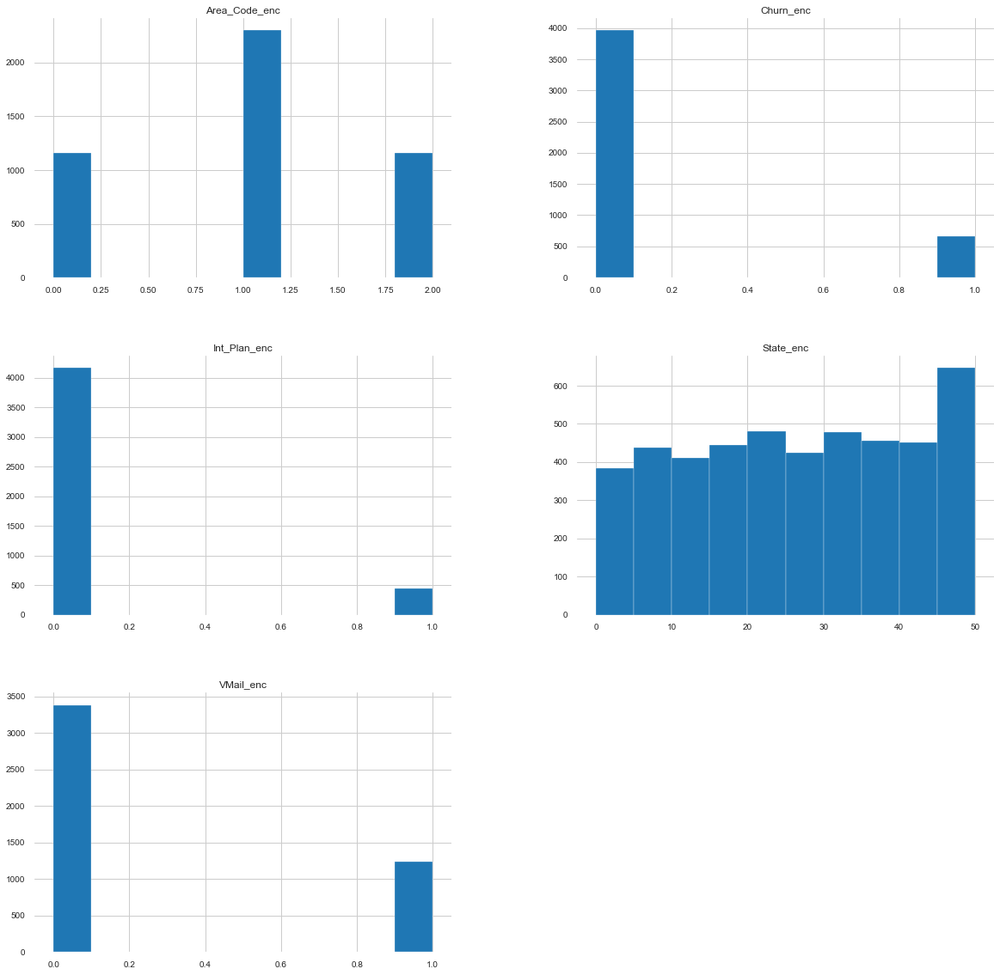

In [23]:
telecom_churn_data_enc[Catvar_list].hist(figsize=(20,20))

In [24]:
Convar_list=['Account_Length','VMailMsg','DayMins','DayCalls','DayCharge','EveMins','EveCalls','EveCharge','NightMins',
            'NightCalls','NightCharge','IntMins','IntCharge']

In [25]:
for i in Convar_list:
    telecom_churn_data_enc[i]=telecom_churn_data_enc[i].astype('float').astype(int)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000236540CE780>,
      dtype=object)

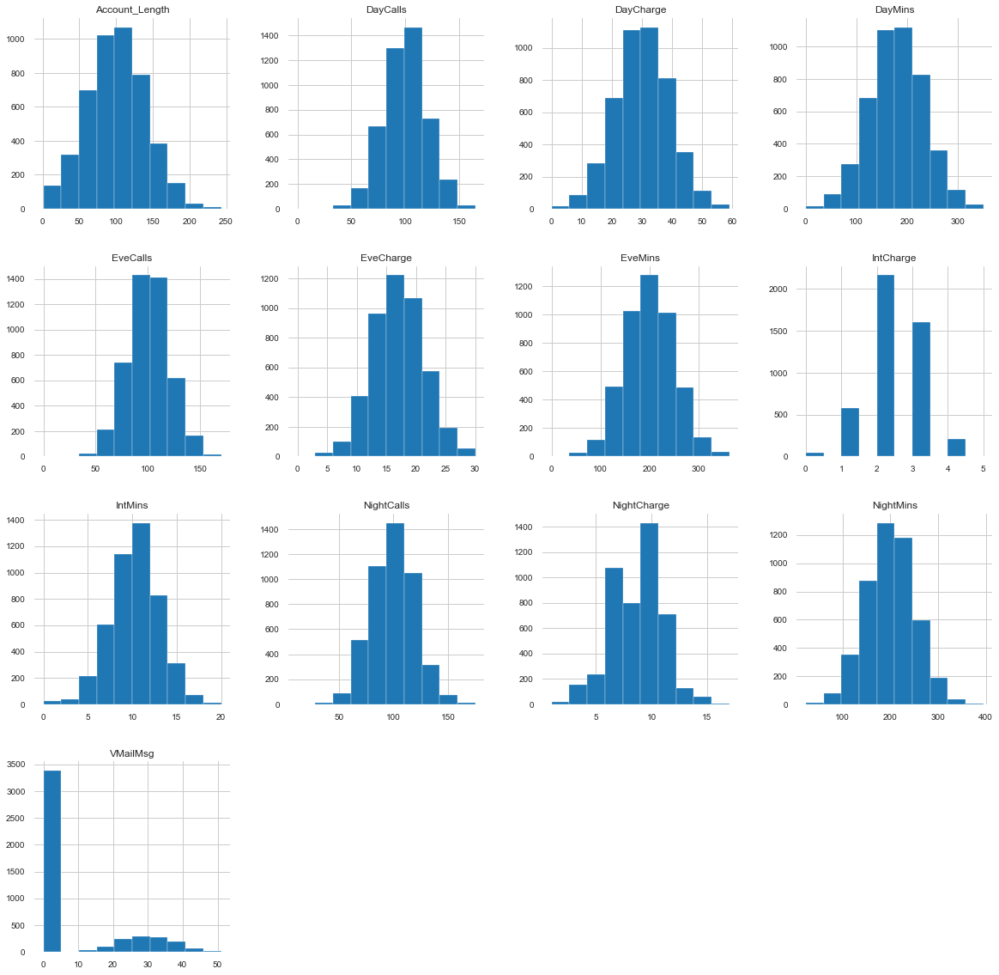

In [26]:
telecom_churn_data_enc[Convar_list].hist(figsize=(20,20))

In [27]:
X_DT = telecom_churn_data_enc.drop(columns=['Churn_enc'], axis=1)
y_DT = telecom_churn_data_enc.Churn_enc

In [28]:
X_train_DT, X_test_DT, y_train_DT, y_test_DT = train_test_split(X_DT, y_DT, test_size=0.25, random_state=10)

In [29]:
XGBoostError = ""
LightGBMError = ""
ValueError = ""
def plot_feature_importances(clf, X_train, y_train=None, 
                             top_n=10, figsize=(8,8), print_table=False, title="Feature Importances"):
    '''
    plot feature importances of a tree-based sklearn estimator
    
    Note: X_train and y_train are pandas DataFrames
    
    Note: Scikit-plot is a lovely package but I sometimes have issues
              1. flexibility/extendibility
              2. complicated models/datasets
          But for many situations Scikit-plot is the way to go
          see https://scikit-plot.readthedocs.io/en/latest/Quickstart.html
    
    Parameters
    ----------
        clf         (sklearn estimator) if not fitted, this routine will fit it
        
        X_train     (pandas DataFrame)
        
        y_train     (pandas DataFrame)  optional
                                        required only if clf has not already been fitted 
        
        top_n       (int)               Plot the top_n most-important features
                                        Default: 10
                                        
        figsize     ((int,int))         The physical size of the plot
                                        Default: (8,8)
        
        print_table (boolean)           If True, print out the table of feature importances
                                        Default: False
        
    Returns
    -------
        the pandas dataframe with the features and their importance
        
    Author
    ------
        George Fisher
    '''
    
    __name__ = "plot_feature_importances"
    
    
    try: 
        if not hasattr(clf, 'feature_importances_'):
            clf.fit(X_train.values, y_train.values.ravel())

            if not hasattr(clf, 'feature_importances_'):
                raise AttributeError("{} does not have feature_importances_ attribute".
                                    format(clf.__class__.__name__))
                
    #except (XGBoostError, LightGBMError, ValueError):
    except:
        clf.fit(X_train.values, y_train.values.ravel())
            
    feat_imp = pd.DataFrame({'importance':clf.feature_importances_})    
    feat_imp['feature'] = X_train.columns
    feat_imp.sort_values(by='importance', ascending=False, inplace=True)
    feat_imp = feat_imp.iloc[:top_n]
    plt.rcParams.update({'figure.autolayout': True})
    #plt.rcParams["axes.edgecolor"] = "0.15"
    #plt.rcParams["axes.linewidth"]  = 1.25
    #plt.grid()

    feat_imp.sort_values(by='importance', inplace=True)
    feat_imp = feat_imp.set_index('feature', drop=True)
    feat_imp.plot.barh(figsize=figsize)
    #plt.title("Feature Importances", fontsize = 15, fontweight="bold")
    plt.xlabel('Feature Importance Score', fontsize = 15)
    plt.ylabel('Features', fontsize = 15)
    plt.savefig('Feature_Importance_before_scaling_ohe.png')
    plt.show()
    
    if print_table:
        from IPython.display import display
        print("Top {} features in descending order of importance".format(top_n))
        display(feat_imp.sort_values(by='importance', ascending=False))
        
    return feat_imp

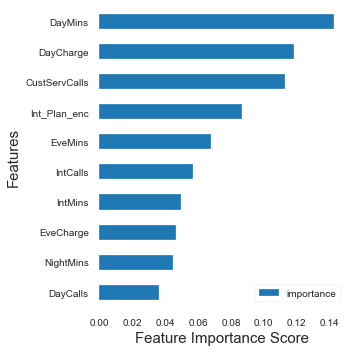

,importance
feature,
DayCalls,0.036414
NightMins,0.044916
EveCharge,0.046902
IntMins,0.049602
IntCalls,0.056969
EveMins,0.067793
Int_Plan_enc,0.086910
CustServCalls,0.112620
DayCharge,0.118560


In [30]:
plot_feature_importances(RandomForestClassifier(random_state=rand_state), X_train_DT, y_train_DT, top_n=10, figsize=(5,5))

In [31]:
clf = DecisionTreeClassifier(max_depth=4)
clf = clf.fit(X_train_DT,y_train_DT)
y_pred = clf.predict(X_test_DT)

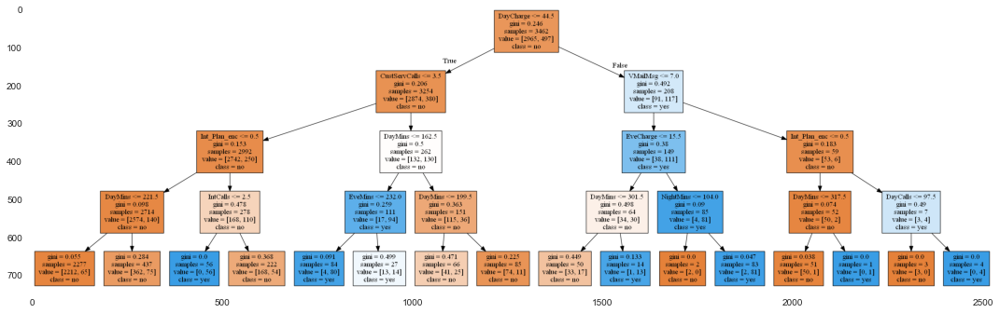

In [32]:
dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=X_train_DT.columns,  
                                class_names=['no', 'yes'],
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph
graph.render("DT")

plt.figure(figsize=(15,15))

img = mpimg.imread('DT.png')
imgplot = plt.imshow(img)
plt.show()

In [33]:
scaler = MinMaxScaler()

In [34]:
telecom_churn_data_enc_scaled = pd.DataFrame(scaler.fit_transform(telecom_churn_data_enc), columns=telecom_churn_data_enc.columns)

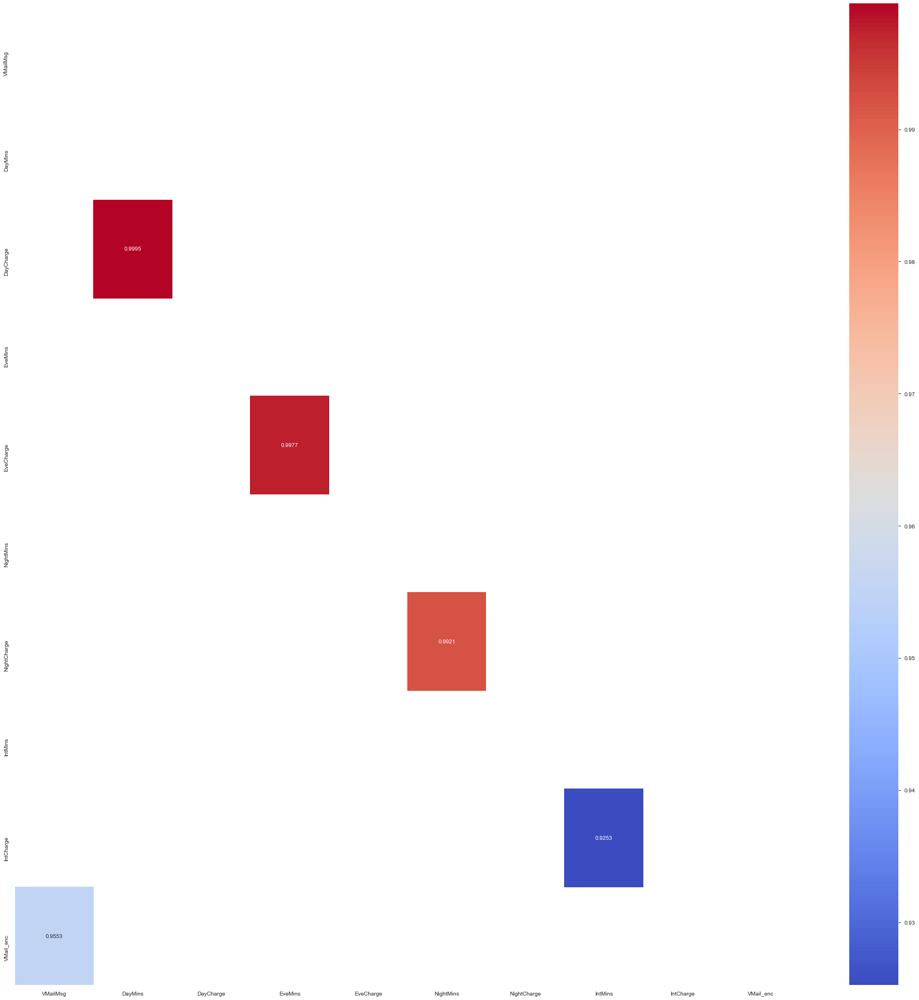

In [35]:
corr = telecom_churn_data_enc_scaled.corr()

kot = corr[(corr>=.8) & (corr<1)]
kot.dropna(axis=0, how='all', inplace = True)
kot.dropna(axis=1, how='all', inplace = True)
plt.figure(figsize=(25,25))
#sns.heatmap(kot, annot=True, fmt='.4g', cmap= 'coolwarm', linewidths=3, linecolor='black')

matrix = np.triu(kot)
sns.heatmap(kot, annot=True, fmt='.4g', cmap= 'coolwarm', mask = matrix)

In [36]:
kot

,VMailMsg,DayMins,DayCharge,EveMins,EveCharge,NightMins,NightCharge,IntMins,IntCharge,VMail_enc
VMailMsg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.95528
DayMins,NaN,NaN,0.999502,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DayCharge,NaN,0.999502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EveMins,NaN,NaN,NaN,NaN,0.997663,NaN,NaN,NaN,NaN,NaN
EveCharge,NaN,NaN,NaN,0.997663,NaN,NaN,NaN,NaN,NaN,NaN
NightMins,NaN,NaN,NaN,NaN,NaN,NaN,0.992121,NaN,NaN,NaN
NightCharge,NaN,NaN,NaN,NaN,NaN,0.992121,NaN,NaN,NaN,NaN
IntMins,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.925258,NaN
IntCharge,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.925258,NaN,NaN
VMail_enc,0.95528,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
corr_matrix = telecom_churn_data_enc_scaled.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]

to_drop

['DayCharge', 'EveCharge', 'NightCharge', 'IntCharge', 'VMail_enc']

In [38]:
telecom_churn_data_no_corr = telecom_churn_data_enc_scaled.drop(columns=to_drop, axis=1)

In [39]:
telecom_churn_data_no_corr.columns

Index(['Account_Length', 'VMailMsg', 'DayMins', 'DayCalls', 'EveMins',
       'EveCalls', 'NightMins', 'NightCalls', 'IntMins', 'IntCalls',
       'CustServCalls', 'State_enc', 'Area_Code_enc', 'Int_Plan_enc',
       'Churn_enc'],
      dtype='object')

In [40]:
ProfileReport(telecom_churn_data_no_corr)

In [41]:
X = telecom_churn_data_no_corr.drop(columns=['Churn_enc'], axis=1)
y = telecom_churn_data_no_corr.Churn_enc

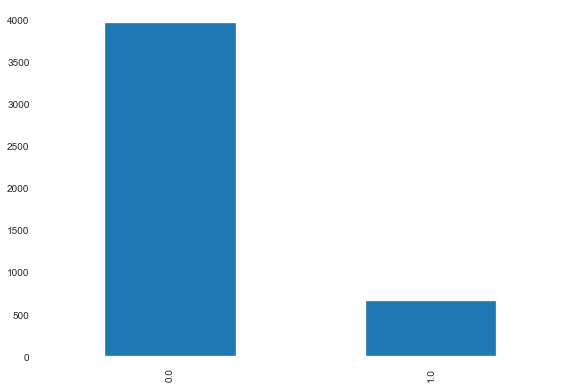

In [42]:
y.value_counts().plot(kind='bar')

In [43]:
smote = SMOTE()

In [44]:
X_smote, y_smote = smote.fit_sample(X.astype('float'), y)

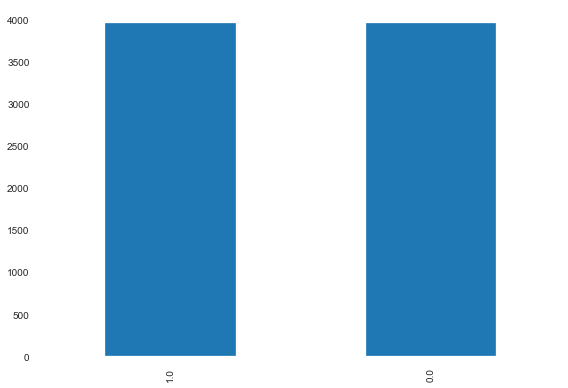

In [45]:
y_smote.value_counts().plot(kind='bar')

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.25, random_state=rand_state)

In [47]:
y_train.value_counts()

1.0    2976
0.0    2965
Name: Churn_enc, dtype: int64

In [48]:
y_test.value_counts()

0.0    996
1.0    985
Name: Churn_enc, dtype: int64

### Modeling

In [49]:
cv = KFold(n_splits=n_iterations, random_state=rand_state)

In [50]:
results_df = pd.DataFrame(columns=['Classifier', 'Features', 'Accuracy', 'Parameters', 'Recall', 
                                   'Precision', 'FPR', 'TPR', 'AUC', 'True_Positives', 
                                   'True_Negatives', 'False_Positives', 'False_Negatives'])
results_df

,Classifier,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives


In [51]:
def confusion_mat(y_test, y_pred):
    print('Confusion Matrix::\n')
    print(pd.crosstab(y_test, y_pred))
    print()
    print('Classification Report::')
    print(classification_report(y_test, y_pred))
    TN = pd.crosstab(y_test, y_pred).iloc[0, 0]
    FP = pd.crosstab(y_test, y_pred).iloc[0, 1]
    FN = pd.crosstab(y_test, y_pred).iloc[1, 0]
    TP = pd.crosstab(y_test, y_pred).iloc[1, 1]
    Cost = (FP*10)+(FN*500)
    Recall = recall_score(y_test, y_pred)
    Precision = precision_score(y_test, y_pred)
    Accuracy = accuracy_score(y_test, y_pred)
    return(FP, FN, TP, TN, Accuracy, Recall, Precision)

In [52]:
clfsDict = {'Logistic Regression': LogisticRegression(solver = 'lbfgs', random_state=rand_state),
            'SVM (SVC)': SVC(gamma = 0.5, random_state=rand_state, probability=True), 
            'Gaussian Naive-Bayes': GaussianNB(),
            'Bernoulli Naive-Bayes': BernoulliNB(),
            'Decision Tree': DecisionTreeClassifier(random_state=rand_state),
            'Random Forest': RandomForestClassifier(n_estimators=100, random_state=rand_state),
            'XGB': XGBClassifier(random_state=rand_state)}

In [53]:
for mdl, clf in clfsDict.items():
    start_1 = time()
    acc = cross_val_score(clf,X_train,y=y_train,cv=cv)
    clf.fit(X_train, y_train)
    y_pred_full_data = clf.predict(X_test)
    y_pred_proba_full_data = clf.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test,  y_pred_proba_full_data)
    auc = roc_auc_score(y_test, y_pred_proba_full_data)
    (FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_full_data)
    results_df = results_df.append({'Classifier':mdl
                                    , 'Features':'Full'
                                    , 'Parameters': 'Default'
                                    , 'Accuracy': Accuracy
                                    , 'Recall': Recall
                                    , 'Precision': Precision
                                    , 'FPR': fpr
                                    , 'TPR': tpr
                                    , 'AUC': auc
                                    , 'True_Positives': TP
                                    , 'True_Negatives': TN
                                    , 'False_Positives': FP
                                    , 'False_Negatives': FN
                                   }
                                   , ignore_index=True
                                  )
    print()
    print('Process Time:: %0f' %(time()-start_1))
    print()

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        768  228
1.0        182  803

Classification Report::
              precision    recall  f1-score   support

         0.0       0.81      0.77      0.79       996
         1.0       0.78      0.82      0.80       985

    accuracy                           0.79      1981
   macro avg       0.79      0.79      0.79      1981
weighted avg       0.79      0.79      0.79      1981


Process Time:: 0.367046

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        835  161
1.0        107  878

Classification Report::
              precision    recall  f1-score   support

         0.0       0.89      0.84      0.86       996
         1.0       0.85      0.89      0.87       985

    accuracy                           0.86      1981
   macro avg       0.87      0.86      0.86      1981
weighted avg       0.87      0.86      0.86      1981


Process Time:: 39.827662

Confusion Matrix::

col_0      0.0  1.0
Chu

In [54]:
results_df

,Classifier,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
0,Logistic Regression,Full,0.793034,Default,0.815228,0.778855,"[0.0, 0.0, 0.0, 0.002008032128514056, 0.002008...","[0.0, 0.0010152284263959391, 0.020304568527918...",0.848556,803,768,228,182
1,SVM (SVC),Full,0.864715,Default,0.891371,0.845043,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",0.921697,878,835,161,107
2,Gaussian Naive-Bayes,Full,0.823826,Default,0.783756,0.850220,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.039593908629441...",0.860070,772,860,136,213
3,Bernoulli Naive-Bayes,Full,0.649672,Default,0.879188,0.600972,"[0.0, 0.006024096385542169, 0.0371485943775100...","[0.0, 0.03959390862944162, 0.19593908629441625...",0.701703,866,421,575,119
4,Decision Tree,Full,0.926300,Default,0.937056,0.916584,"[0.0, 0.08433734939759036, 1.0]","[0.0, 0.9370558375634518, 1.0]",0.926359,923,912,84,62
5,Random Forest,Full,0.964160,Default,0.958376,0.969199,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.08629441624365482, 0.20101522842639594...",0.995022,944,966,30,41
6,XGB,Full,0.975770,Default,0.962437,0.988530,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",0.993093,948,985,11,37


In [55]:
clf = RandomForestClassifier(n_estimators=100, random_state=rand_state)
selector = RFECV(estimator=clf, step = 4, cv=3, scoring='accuracy')

In [56]:
#%%time

feature_fit = selector.fit(X_train, y_train)

print('The number of selected features with CV:: ', feature_fit.n_features_)
print('Selected Features:: ', X_train.columns[selector.support_])

The number of selected features with CV::  14
Selected Features::  Index(['Account_Length', 'VMailMsg', 'DayMins', 'DayCalls', 'EveMins',
       'EveCalls', 'NightMins', 'NightCalls', 'IntMins', 'IntCalls',
       'CustServCalls', 'State_enc', 'Area_Code_enc', 'Int_Plan_enc'],
      dtype='object')


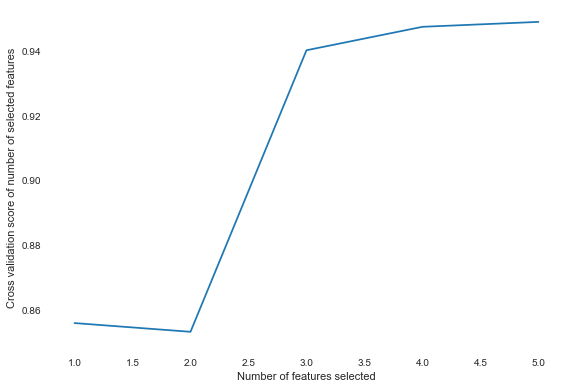

In [57]:
# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score of number of selected features")
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_)
plt.show()

In [58]:
selector.grid_scores_

array([0.85591682, 0.8532216 , 0.9400772 , 0.94731456, 0.94883056])

In [59]:
X_train_reduced_features = X_train[X_train.columns[selector.support_]]
X_test_reduced_features = X_test[X_test.columns[selector.support_]]

In [60]:
X_train_reduced_features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5941 entries, 5448 to 1289
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Account_Length  5941 non-null   float64
 1   VMailMsg        5941 non-null   float64
 2   DayMins         5941 non-null   float64
 3   DayCalls        5941 non-null   float64
 4   EveMins         5941 non-null   float64
 5   EveCalls        5941 non-null   float64
 6   NightMins       5941 non-null   float64
 7   NightCalls      5941 non-null   float64
 8   IntMins         5941 non-null   float64
 9   IntCalls        5941 non-null   float64
 10  CustServCalls   5941 non-null   float64
 11  State_enc       5941 non-null   float64
 12  Area_Code_enc   5941 non-null   float64
 13  Int_Plan_enc    5941 non-null   float64
dtypes: float64(14)
memory usage: 696.2 KB


In [61]:
clfsDict = {#'Logistic Regression': LogisticRegression(solver = 'lbfgs', random_state=rand_state),
            #'SVM (SVC)': SVC(gamma = 0.5, random_state=rand_state, probability=True), 
            #'Gaussian Naive-Bayes': GaussianNB(),
            #'Bernoulli Naive-Bayes': BernoulliNB(),
            'Decision Tree': DecisionTreeClassifier(random_state=rand_state),
            'Random Forest': RandomForestClassifier(n_estimators=100, random_state=rand_state),
            'XGB': XGBClassifier(random_state=rand_state)}

In [62]:
for mdl, clf in clfsDict.items():
    start_1 = time()
    acc = cross_val_score(clf,X_train_reduced_features,y=y_train,cv=cv)
    clf.fit(X_train_reduced_features, y_train)
    y_pred_full_data = clf.predict(X_test_reduced_features)
    y_pred_proba_full_data = clf.predict_proba(X_test_reduced_features)[:, 1]
    fpr, tpr, _ = roc_curve(y_test,  y_pred_proba_full_data)
    auc = roc_auc_score(y_test, y_pred_proba_full_data)
    (FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_full_data)
    results_df = results_df.append({'Classifier':mdl
                                    , 'Features':'Reduced'
                                    , 'Parameters': 'Default'
                                    , 'Accuracy': Accuracy
                                    , 'Recall': Recall
                                    , 'Precision': Precision
                                    , 'FPR': fpr
                                    , 'TPR': tpr
                                    , 'AUC': auc
                                    , 'True_Positives': TP
                                    , 'True_Negatives': TN
                                    , 'False_Positives': FP
                                    , 'False_Negatives': FN
                                   }
                                   , ignore_index=True
                                  )
    print()
    print('Process Time:: %0f' %(time()-start_1))
    print()

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        912   84
1.0         62  923

Classification Report::
              precision    recall  f1-score   support

         0.0       0.94      0.92      0.93       996
         1.0       0.92      0.94      0.93       985

    accuracy                           0.93      1981
   macro avg       0.93      0.93      0.93      1981
weighted avg       0.93      0.93      0.93      1981


Process Time:: 0.463758

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        966   30
1.0         41  944

Classification Report::
              precision    recall  f1-score   support

         0.0       0.96      0.97      0.96       996
         1.0       0.97      0.96      0.96       985

    accuracy                           0.96      1981
   macro avg       0.96      0.96      0.96      1981
weighted avg       0.96      0.96      0.96      1981


Process Time:: 8.439189

Confusion Matrix::

col_0      0.0  1.0
Chur

In [63]:
results_df.sort_values(by='AUC', ascending=True)

,Classifier,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
3,Bernoulli Naive-Bayes,Full,0.649672,Default,0.879188,0.600972,"[0.0, 0.006024096385542169, 0.0371485943775100...","[0.0, 0.03959390862944162, 0.19593908629441625...",0.701703,866,421,575,119
0,Logistic Regression,Full,0.793034,Default,0.815228,0.778855,"[0.0, 0.0, 0.0, 0.002008032128514056, 0.002008...","[0.0, 0.0010152284263959391, 0.020304568527918...",0.848556,803,768,228,182
2,Gaussian Naive-Bayes,Full,0.823826,Default,0.783756,0.850220,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.039593908629441...",0.860070,772,860,136,213
1,SVM (SVC),Full,0.864715,Default,0.891371,0.845043,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",0.921697,878,835,161,107
4,Decision Tree,Full,0.926300,Default,0.937056,0.916584,"[0.0, 0.08433734939759036, 1.0]","[0.0, 0.9370558375634518, 1.0]",0.926359,923,912,84,62
7,Decision Tree,Reduced,0.926300,Default,0.937056,0.916584,"[0.0, 0.08433734939759036, 1.0]","[0.0, 0.9370558375634518, 1.0]",0.926359,923,912,84,62
6,XGB,Full,0.975770,Default,0.962437,0.988530,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",0.993093,948,985,11,37
9,XGB,Reduced,0.975770,Default,0.962437,0.988530,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",0.993093,948,985,11,37
5,Random Forest,Full,0.964160,Default,0.958376,0.969199,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.08629441624365482, 0.20101522842639594...",0.995022,944,966,30,41
8,Random Forest,Reduced,0.964160,Default,0.958376,0.969199,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.08629441624365482, 0.20101522842639594...",0.995022,944,966,30,41


In [64]:
scores = ['precision'
          , 'recall'
          , 'accuracy'
         ]

In [65]:
def report_perf(clf, n_top = 3, clf_name = "", verbose=True):
    if(verbose):
        for n in range(1, n_top+1):
            candidates = np.flatnonzero(clf.cv_results_['rank_test_recall'] == n)
            for candidate in candidates:
                print('Model with rank: {0}'.format(n))
                print('Mean validation score (Recall on Test): {0:.3f} (std: {1:.3f})'.format(
                    clf.cv_results_['mean_test_recall'][candidate], clf.cv_results_['std_test_recall'][candidate]))
                print('ParametersL {0}',format(clf.cv_results_['params'][candidate]))
    return{'Classifier': clf_name
           , 'Best_Parameters': str(clf.best_params_)
           , 'Best_Estimator': str(clf.best_estimator_)
#           , 'Accuracy_Mean':clf.cv_results_['mean_test_acc'][clf.best_index_]
#           , 'Accuracy_std':clf.cv_results_['std_test_acc'][clf.best_index_]
           , 'Precision_Mean':clf.cv_results_['mean_test_precision'][clf.best_index_]
           , 'Precision_std':clf.cv_results_['std_test_precision'][clf.best_index_]
           , 'Recall_Mean':clf.cv_results_['mean_test_recall'][clf.best_index_]
           , 'Recall_std':clf.cv_results_['std_test_recall'][clf.best_index_]
          }

In [66]:
tuned_parameters_DT={'max_depth': [10, 20, 30, None]
                     , 'max_features': ['auto', 'sqrt']
                     , 'criterion':['gini','entropy']
                     , 'min_samples_leaf': [1, 2, 4]
                     , 'min_samples_split': [2, 5, 10]
                    }

clf_DT = DecisionTreeClassifier(random_state=rand_state)

In [67]:
#%%time

random_search_DT = RandomizedSearchCV(estimator=clf_DT
                                      , param_distributions=tuned_parameters_DT
                                      , cv = 5
                                      , scoring = scores
                                      , refit ='recall'
                                      , n_iter=10
                                     )

In [68]:
random_search_DT.fit(X_train_reduced_features, y_train)

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=10,
            

In [69]:
DT_report = report_perf(random_search_DT, n_top = 3, clf_name='Decision_Tree')
DT_report

Model with rank: 1
Mean validation score (Recall on Test): 0.887 (std: 0.005)
ParametersL {0} {'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 30, 'criterion': 'entropy'}
Model with rank: 1
Mean validation score (Recall on Test): 0.887 (std: 0.005)
ParametersL {0} {'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 30, 'criterion': 'entropy'}
Model with rank: 3
Mean validation score (Recall on Test): 0.866 (std: 0.012)
ParametersL {0} {'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 20, 'criterion': 'entropy'}


{'Classifier': 'Decision_Tree',
 'Best_Parameters': "{'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 30, 'criterion': 'entropy'}",
 'Best_Estimator': "DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',\n                       max_depth=30, max_features='auto', max_leaf_nodes=None,\n                       min_impurity_decrease=0.0, min_impurity_split=None,\n                       min_samples_leaf=1, min_samples_split=5,\n                       min_weight_fraction_leaf=0.0, presort='deprecated',\n                       random_state=10, splitter='best')",
 'Precision_Mean': 0.8837390470021067,
 'Precision_std': 0.011219952167890106,
 'Recall_Mean': 0.8874350008459759,
 'Recall_std': 0.00504528370118433}

In [70]:
tuned_parameters_RF={'n_estimators':[100, 200]
                     , 'max_depth':[25, 50, None]
                     , 'criterion':['gini','entropy']
                     , 'min_samples_leaf': [1, 25, 50]
                     , 'max_features':[.2, .3, 'auto']
                     , 'min_samples_split':[2, 4, 8, 10, 12]
                    }

clf_RF = RandomForestClassifier(random_state=rand_state)

In [71]:
#%%time

random_search_RF = RandomizedSearchCV(estimator=clf_RF
                                      , param_distributions=tuned_parameters_RF
                                      , cv = 5
                                      , scoring = scores
                                      , refit = 'recall'
                                      , n_iter=10
                                     )

random_search_RF.fit(X_train_reduced_features, y_train)

RF_report = report_perf(random_search_RF, n_top = 3, clf_name='Random_Forest')

Model with rank: 1
Mean validation score (Recall on Test): 0.946 (std: 0.009)
ParametersL {0} {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 25, 'criterion': 'entropy'}
Model with rank: 2
Mean validation score (Recall on Test): 0.933 (std: 0.007)
ParametersL {0} {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 0.3, 'max_depth': None, 'criterion': 'gini'}
Model with rank: 3
Mean validation score (Recall on Test): 0.932 (std: 0.011)
ParametersL {0} {'n_estimators': 100, 'min_samples_split': 8, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 50, 'criterion': 'gini'}


In [72]:
RF_report

{'Classifier': 'Random_Forest',
 'Best_Parameters': "{'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': 25, 'criterion': 'entropy'}",
 'Best_Estimator': "RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,\n                       criterion='entropy', max_depth=25, max_features=0.2,\n                       max_leaf_nodes=None, max_samples=None,\n                       min_impurity_decrease=0.0, min_impurity_split=None,\n                       min_samples_leaf=1, min_samples_split=2,\n                       min_weight_fraction_leaf=0.0, n_estimators=100,\n                       n_jobs=None, oob_score=False, random_state=10, verbose=0,\n                       warm_start=False)",
 'Precision_Mean': 0.9628104561592818,
 'Precision_std': 0.009834345688155608,
 'Recall_Mean': 0.9455665219107777,
 'Recall_std': 0.009043454306356806}

In [73]:
tuned_parameters_XGB={'n_estimators': [100, 150, 1000]
                      , 'learning_rate': [0.01, 0.6, None]
                      , 'subsample': [0.3, 0.9, None]
                      , 'max_depth': [3, 4, 5, 6, 7, 8, 9, None]
                      , 'colsample_bytree': [0.5, 0.9, None]
                      , 'min_child_weight': [1, 2, 3, 4, None]
                     }

clf_XGB = XGBClassifier(random_state=rand_state)

In [74]:
#%%time

random_search_XGB = RandomizedSearchCV(estimator=clf_XGB
                                      , param_distributions=tuned_parameters_XGB
                                      , cv = 5
                                      , scoring = scores
                                      , refit ='recall'
                                      , n_iter=10
                                     )

In [75]:
random_search_XGB.fit(X_train_reduced_features, y_train)

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n...
                   iid='deprecated', n_iter=10, n_jobs=None,
                   param_distributions={'colsample_bytree': [0.5, 0.9, None],
                                        '

In [76]:
XGB_report = report_perf(random_search_XGB, n_top = 3, clf_name='XGBoost')

Model with rank: 1
Mean validation score (Recall on Test): 0.964 (std: 0.003)
ParametersL {0} {'subsample': 0.9, 'n_estimators': 150, 'min_child_weight': 4, 'max_depth': 9, 'learning_rate': None, 'colsample_bytree': None}
Model with rank: 2
Mean validation score (Recall on Test): 0.963 (std: 0.005)
ParametersL {0} {'subsample': None, 'n_estimators': 1000, 'min_child_weight': 1, 'max_depth': 8, 'learning_rate': None, 'colsample_bytree': 0.5}
Model with rank: 3
Mean validation score (Recall on Test): 0.957 (std: 0.009)
ParametersL {0} {'subsample': 0.9, 'n_estimators': 1000, 'min_child_weight': 4, 'max_depth': 6, 'learning_rate': None, 'colsample_bytree': 0.5}


In [77]:
DT_best_params = random_search_DT.best_params_
DT_best_params['random_state'] = rand_state

RF_best_params = random_search_RF.best_params_
RF_best_params['random_state'] = rand_state

XGB_best_params = random_search_XGB.best_params_
XGB_best_params['random_state'] = rand_state

In [78]:
clfsDict = {#'Logistic Regression': LogisticRegression(solver = 'lbfgs', random_state=rand_state),
            #'SVM (SVC)': SVC(gamma = 0.5, random_state=rand_state, probability=True), 
            #'Gaussian Naive-Bayes': GaussianNB(),
            #'Bernoulli Naive-Bayes': BernoulliNB(),
            'Decision Tree': DecisionTreeClassifier(**DT_best_params),
            'Random Forest': RandomForestClassifier(**RF_best_params),
            'XGB': XGBClassifier(**XGB_best_params)}

In [79]:
for mdl, clf in clfsDict.items():
    start_1 = time()
    acc = cross_val_score(clf,X_train_reduced_features,y=y_train,cv=cv)
    clf.fit(X_train_reduced_features, y_train)
    y_pred_full_data = clf.predict(X_test_reduced_features)
    y_pred_proba_full_data = clf.predict_proba(X_test_reduced_features)[:, 1]
    fpr, tpr, _ = roc_curve(y_test,  y_pred_proba_full_data)
    auc = roc_auc_score(y_test, y_pred_proba_full_data)
    (FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_full_data)
    results_df = results_df.append({'Classifier':mdl
                                    , 'Features':'Reduced'
                                    , 'Parameters': 'Best'
                                    , 'Accuracy': Accuracy
                                    , 'Recall': Recall
                                    , 'Precision': Precision
                                    , 'FPR': fpr
                                    , 'TPR': tpr
                                    , 'AUC': auc
                                    , 'True_Positives': TP
                                    , 'True_Negatives': TN
                                    , 'False_Positives': FP
                                    , 'False_Negatives': FN
                                   }
                                   , ignore_index=True
                                  )
    print()
    print('Process Time:: %0f' %(time()-start_1))
    print()

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        892  104
1.0        125  860

Classification Report::
              precision    recall  f1-score   support

         0.0       0.88      0.90      0.89       996
         1.0       0.89      0.87      0.88       985

    accuracy                           0.88      1981
   macro avg       0.88      0.88      0.88      1981
weighted avg       0.88      0.88      0.88      1981


Process Time:: 0.277258

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        963   33
1.0         37  948

Classification Report::
              precision    recall  f1-score   support

         0.0       0.96      0.97      0.96       996
         1.0       0.97      0.96      0.96       985

    accuracy                           0.96      1981
   macro avg       0.96      0.96      0.96      1981
weighted avg       0.96      0.96      0.96      1981


Process Time:: 6.478955

Confusion Matrix::

col_0      0.0  1.0
Chur

In [80]:
results_df.sort_values(by='AUC', ascending=True)

,Classifier,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
3,Bernoulli Naive-Bayes,Full,0.649672,Default,0.879188,0.600972,"[0.0, 0.006024096385542169, 0.0371485943775100...","[0.0, 0.03959390862944162, 0.19593908629441625...",0.701703,866,421,575,119
0,Logistic Regression,Full,0.793034,Default,0.815228,0.778855,"[0.0, 0.0, 0.0, 0.002008032128514056, 0.002008...","[0.0, 0.0010152284263959391, 0.020304568527918...",0.848556,803,768,228,182
2,Gaussian Naive-Bayes,Full,0.823826,Default,0.783756,0.850220,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.039593908629441...",0.860070,772,860,136,213
10,Decision Tree,Reduced,0.884402,Best,0.873096,0.892116,"[0.0, 0.09337349397590361, 0.09437751004016064...","[0.0, 0.8507614213197969, 0.8507614213197969, ...",0.898267,860,892,104,125
1,SVM (SVC),Full,0.864715,Default,0.891371,0.845043,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",0.921697,878,835,161,107
4,Decision Tree,Full,0.926300,Default,0.937056,0.916584,"[0.0, 0.08433734939759036, 1.0]","[0.0, 0.9370558375634518, 1.0]",0.926359,923,912,84,62
7,Decision Tree,Reduced,0.926300,Default,0.937056,0.916584,"[0.0, 0.08433734939759036, 1.0]","[0.0, 0.9370558375634518, 1.0]",0.926359,923,912,84,62
12,XGB,Reduced,0.972236,Best,0.963452,0.980372,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.005076142131979...",0.992419,949,977,19,36
6,XGB,Full,0.975770,Default,0.962437,0.988530,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",0.993093,948,985,11,37
9,XGB,Reduced,0.975770,Default,0.962437,0.988530,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",0.993093,948,985,11,37


In [83]:
clf_DT_best = DecisionTreeClassifier(**DT_best_params)
clf_RF_best = RandomForestClassifier(**RF_best_params)
clf_XGB_Best = XGBClassifier(**XGB_best_params)

In [84]:
models_1 = [clf_DT_best
            , clf_RF_best]

# Get out-of-fold predictions from 1-level models
S_1_train, S_1_test = stacking(models_1
                               , X_train_reduced_features
                               , y_train
                               , X_test_reduced_features
                               , regression = True
                               , metric=precision_score
                               , verbose = 2)

task:         [regression]
metric:       [precision_score]
mode:         [oof_pred_bag]
n_models:     [2]

model  0:     [DecisionTreeClassifier]
    fold  0:  [0.88152327]
    fold  1:  [0.88676671]
    fold  2:  [0.89331437]
    fold  3:  [0.88520408]
    ----
    MEAN:     [0.88670211] + [0.00426587]
    FULL:     [0.88665073]

model  1:     [RandomForestClassifier]
    fold  0:  [0.95163585]
    fold  1:  [0.96986301]
    fold  2:  [0.96619718]
    fold  3:  [0.96525097]
    ----
    MEAN:     [0.96323675] + [0.00691574]
    FULL:     [0.96335616]



In [85]:
# Initialize 2-level models
models_2 = [clf_XGB_Best]

# Get out-of-fold predictions from 2-level models
S_2_train, S_2_test = stacking(models_2
                               , S_1_train
                               , y_train
                               , S_1_test
                               , regression = True
                               , metric=precision_score
                               , verbose = 2)

task:         [regression]
metric:       [precision_score]
mode:         [oof_pred_bag]
n_models:     [1]

model  0:     [XGBClassifier]
    fold  0:  [0.95163585]
    fold  1:  [0.96986301]
    fold  2:  [0.96619718]
    fold  3:  [0.96525097]
    ----
    MEAN:     [0.96323675] + [0.00691574]
    FULL:     [0.96335616]



In [86]:
# Initialize 3-level model
model = LogisticRegression(random_state=rand_state)
# Fit
model.fit(S_2_train, y_train)
# Get final prediction
y_pred_ensemble = model.predict(S_2_test)

In [87]:
model.predict_proba(S_2_test)

array([[0.94404575, 0.05595425],
       [0.94404575, 0.05595425],
       [0.94404575, 0.05595425],
       ...,
       [0.03871157, 0.96128843],
       [0.03871157, 0.96128843],
       [0.94404575, 0.05595425]])

In [88]:
y_pred_proba = model.predict_proba(S_2_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_ensemble)
results_df = results_df.append({'Classifier':'Vecstack'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        955   41
1.0         33  952

Classification Report::
              precision    recall  f1-score   support

         0.0       0.97      0.96      0.96       996
         1.0       0.96      0.97      0.96       985

    accuracy                           0.96      1981
   macro avg       0.96      0.96      0.96      1981
weighted avg       0.96      0.96      0.96      1981



In [89]:
sclf = StackingCVClassifier(classifiers=[clf_DT_best, clf_RF_best, clf_XGB_Best]
                            , use_probas=True
                            , random_state= rand_state
                            , meta_classifier=LogisticRegression(random_state=rand_state))

In [90]:
label = ['Decision Tree', 'Random Forest', 'XGBoost', 'Stacking Classifier']
clf_list = [clf_DT_best, clf_RF_best, clf_XGB_Best, sclf]
    
sclf.fit(X_train_reduced_features, y_train)
y_pred_sclf = sclf.predict(X_test_reduced_features)

In [91]:
y_pred_proba = sclf.predict_proba(X_test_reduced_features)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_sclf)
results_df = results_df.append({'Classifier':'StackingCV'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        976   20
1.0         31  954

Classification Report::
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97       996
         1.0       0.98      0.97      0.97       985

    accuracy                           0.97      1981
   macro avg       0.97      0.97      0.97      1981
weighted avg       0.97      0.97      0.97      1981



In [92]:
final_layer = StackingClassifier(estimators=[('rf', clf_RF_best)
                                            , ('xgb', clf_XGB_Best)]
                                , final_estimator=LogisticRegression(random_state=rand_state)
                               )

multi_layer_regressor = StackingClassifier(estimators=[('dt', clf_DT_best)]
                                          , final_estimator=final_layer
                                         )

multi_layer_regressor.fit(X_train_reduced_features, y_train)

y_pred_multi = multi_layer_regressor.predict(X_test_reduced_features)

In [93]:
y_pred_proba = multi_layer_regressor.predict_proba(X_test_reduced_features)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_multi)
results_df = results_df.append({'Classifier':'Stacking (Logistic)'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        892  104
1.0        125  860

Classification Report::
              precision    recall  f1-score   support

         0.0       0.88      0.90      0.89       996
         1.0       0.89      0.87      0.88       985

    accuracy                           0.88      1981
   macro avg       0.88      0.88      0.88      1981
weighted avg       0.88      0.88      0.88      1981



In [94]:
ensemble_estimators = [('rf', clf_RF_best)
                       , ('xgb', clf_XGB_Best)
                       , ('dt', clf_DT_best)
#                       , ('logistic', LogisticRegression(random_state=rand_state))
                      ]

clf_ensemble = StackingClassifier(estimators=ensemble_estimators
                                  , final_estimator=CalibratedClassifierCV(SGDClassifier(random_state=rand_state))
#                                  , final_estimator=SVC(gamma = 0.5, random_state=rand_state)
                                 )

clf_ensemble.fit(X_train_reduced_features, y_train)

StackingClassifier(cv=None,
                   estimators=[('rf',
                                RandomForestClassifier(bootstrap=True,
                                                       ccp_alpha=0.0,
                                                       class_weight=None,
                                                       criterion='entropy',
                                                       max_depth=25,
                                                       max_features=0.2,
                                                       max_leaf_nodes=None,
                                                       max_samples=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                       

In [95]:
y_pred_ens = clf_ensemble.predict(X_test_reduced_features)

In [96]:
y_pred_proba = clf_ensemble.predict_proba(X_test_reduced_features)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_ens)
results_df = results_df.append({'Classifier':'Stacking (SGD)'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        977   19
1.0         32  953

Classification Report::
              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97       996
         1.0       0.98      0.97      0.97       985

    accuracy                           0.97      1981
   macro avg       0.97      0.97      0.97      1981
weighted avg       0.97      0.97      0.97      1981



In [97]:
ensemble_estimators_5 = [('rf', clf_RF_best)
                       , ('xgb', clf_XGB_Best)
                       , ('dt', clf_DT_best)
#                       , ('logistic', LogisticRegression(random_state=rand_state))
                      ]

clf_ensemble_5 = StackingClassifier(estimators=ensemble_estimators_5
#                                   , final_estimator=SGDClassifier(random_state=rand_state)
                                    , final_estimator=CalibratedClassifierCV(SVC(gamma = 0.5, random_state=rand_state))
                                 )

clf_ensemble_5.fit(X_train_reduced_features, y_train)

StackingClassifier(cv=None,
                   estimators=[('rf',
                                RandomForestClassifier(bootstrap=True,
                                                       ccp_alpha=0.0,
                                                       class_weight=None,
                                                       criterion='entropy',
                                                       max_depth=25,
                                                       max_features=0.2,
                                                       max_leaf_nodes=None,
                                                       max_samples=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                       

In [98]:
y_pred_ens_5 = clf_ensemble_5.predict(X_test_reduced_features)

In [99]:
y_pred_proba = clf_ensemble_5.predict_proba(X_test_reduced_features)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_ens_5)
results_df = results_df.append({'Classifier':'Stacking (SVC)'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        983   13
1.0         41  944

Classification Report::
              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97       996
         1.0       0.99      0.96      0.97       985

    accuracy                           0.97      1981
   macro avg       0.97      0.97      0.97      1981
weighted avg       0.97      0.97      0.97      1981



In [100]:
clf_ensemble_6 = VotingClassifier(estimators=[('rf', clf_RF_best)
                                              , ('xgb', clf_XGB_Best)
                                              , ('dt', clf_DT_best)]
                                  , voting='soft')

clf_ensemble_6.fit(X_train_reduced_features, y_train)

VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(bootstrap=True,
                                                     ccp_alpha=0.0,
                                                     class_weight=None,
                                                     criterion='entropy',
                                                     max_depth=25,
                                                     max_features=0.2,
                                                     max_leaf_nodes=None,
                                                     max_samples=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
          

In [101]:
y_pred_ens_6 = clf_ensemble_6.predict(X_test_reduced_features)

In [102]:
y_pred_proba = clf_ensemble_6.predict_proba(X_test_reduced_features)[:, 1]
fpr, tpr, _ = roc_curve(y_test,  y_pred_proba)
auc = roc_auc_score(y_test, y_pred_proba)

(FP, FN, TP, TN, Accuracy, Recall, Precision) = confusion_mat(y_test, y_pred_ens_6)
results_df = results_df.append({'Classifier':'Voting'
                                , 'Features':'Reduced'
                                , 'Parameters': 'Best'
                                , 'Accuracy': Accuracy
                                , 'Recall': Recall
                                , 'Precision': Precision
                                , 'FPR': fpr
                                , 'TPR': tpr
                                , 'AUC': auc
                                , 'True_Positives': TP
                                , 'True_Negatives': TN
                                , 'False_Positives': FP
                                , 'False_Negatives': FN
                               }
                               , ignore_index=True
                              )

Confusion Matrix::

col_0      0.0  1.0
Churn_enc          
0.0        961   35
1.0         40  945

Classification Report::
              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       996
         1.0       0.96      0.96      0.96       985

    accuracy                           0.96      1981
   macro avg       0.96      0.96      0.96      1981
weighted avg       0.96      0.96      0.96      1981



In [103]:
results_df

,Classifier,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
0,Logistic Regression,Full,0.793034,Default,0.815228,0.778855,"[0.0, 0.0, 0.0, 0.002008032128514056, 0.002008...","[0.0, 0.0010152284263959391, 0.020304568527918...",0.848556,803,768,228,182
1,SVM (SVC),Full,0.864715,Default,0.891371,0.845043,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",0.921697,878,835,161,107
2,Gaussian Naive-Bayes,Full,0.823826,Default,0.783756,0.850220,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.039593908629441...",0.860070,772,860,136,213
3,Bernoulli Naive-Bayes,Full,0.649672,Default,0.879188,0.600972,"[0.0, 0.006024096385542169, 0.0371485943775100...","[0.0, 0.03959390862944162, 0.19593908629441625...",0.701703,866,421,575,119
4,Decision Tree,Full,0.926300,Default,0.937056,0.916584,"[0.0, 0.08433734939759036, 1.0]","[0.0, 0.9370558375634518, 1.0]",0.926359,923,912,84,62
5,Random Forest,Full,0.964160,Default,0.958376,0.969199,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.08629441624365482, 0.20101522842639594...",0.995022,944,966,30,41
6,XGB,Full,0.975770,Default,0.962437,0.988530,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",0.993093,948,985,11,37
7,Decision Tree,Reduced,0.926300,Default,0.937056,0.916584,"[0.0, 0.08433734939759036, 1.0]","[0.0, 0.9370558375634518, 1.0]",0.926359,923,912,84,62
8,Random Forest,Reduced,0.964160,Default,0.958376,0.969199,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.08629441624365482, 0.20101522842639594...",0.995022,944,966,30,41
9,XGB,Reduced,0.975770,Default,0.962437,0.988530,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",0.993093,948,985,11,37


In [104]:
results_df_temp = results_df.sort_values(by=['Classifier', 'AUC']).groupby('Classifier').last()

In [105]:
results_df.sort_values(by=['Classifier', 'AUC']).groupby('Classifier').last()

,Features,Accuracy,Parameters,Recall,Precision,FPR,TPR,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
Classifier,,,,,,,,,,,,
Bernoulli Naive-Bayes,Full,0.649672,Default,0.879188,0.600972,"[0.0, 0.006024096385542169, 0.0371485943775100...","[0.0, 0.03959390862944162, 0.19593908629441625...",0.701703,866,421,575,119
Decision Tree,Reduced,0.926300,Default,0.937056,0.916584,"[0.0, 0.08433734939759036, 1.0]","[0.0, 0.9370558375634518, 1.0]",0.926359,923,912,84,62
Gaussian Naive-Bayes,Full,0.823826,Default,0.783756,0.850220,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.039593908629441...",0.860070,772,860,136,213
Logistic Regression,Full,0.793034,Default,0.815228,0.778855,"[0.0, 0.0, 0.0, 0.002008032128514056, 0.002008...","[0.0, 0.0010152284263959391, 0.020304568527918...",0.848556,803,768,228,182
Random Forest,Reduced,0.964160,Default,0.958376,0.969199,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.08629441624365482, 0.20101522842639594...",0.995022,944,966,30,41
SVM (SVC),Full,0.864715,Default,0.891371,0.845043,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",0.921697,878,835,161,107
Stacking (Logistic),Reduced,0.884402,Best,0.873096,0.892116,"[0.0, 0.09337349397590361, 0.10140562248995984...","[0.0, 0.8507614213197969, 0.8639593908629442, ...",0.898264,860,892,104,125
Stacking (SGD),Reduced,0.974255,Best,0.967513,0.980453,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",0.995065,953,977,19,32
Stacking (SVC),Reduced,0.972741,Best,0.958376,0.986416,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.006091370558375...",0.982644,944,983,13,41


In [106]:
roc_plot_df = results_df_temp[['Features', 'Parameters', 
                               'AUC', 'FPR', 'TPR']].sort_values(by = 'AUC', 
                                                                         ascending=False)

In [107]:
roc_plot_df['Clf'] = roc_plot_df[['Features', 'Parameters']].apply(lambda x: '_'.join(x), axis=1)

In [108]:
roc_plot_df

,Features,Parameters,AUC,FPR,TPR,Clf
Classifier,,,,,,
StackingCV,Reduced,Best,0.995329,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",Reduced_Best
Stacking (SGD),Reduced,Best,0.995065,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",Reduced_Best
Random Forest,Reduced,Default,0.995022,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.08629441624365482, 0.20101522842639594...",Reduced_Default
XGB,Reduced,Default,0.993093,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",Reduced_Default
Voting,Reduced,Best,0.992768,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.002030456852791...",Reduced_Best
Stacking (SVC),Reduced,Best,0.982644,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0010152284263959391, 0.006091370558375...",Reduced_Best
Vecstack,Reduced,Best,0.962666,"[0.0, 0.04116465863453815, 1.0]","[0.0, 0.966497461928934, 1.0]",Reduced_Best
Decision Tree,Reduced,Default,0.926359,"[0.0, 0.08433734939759036, 1.0]","[0.0, 0.9370558375634518, 1.0]",Reduced_Default
SVM (SVC),Full,Default,0.921697,"[0.0, 0.0, 0.0, 0.001004016064257028, 0.001004...","[0.0, 0.0010152284263959391, 0.009137055837563...",Full_Default


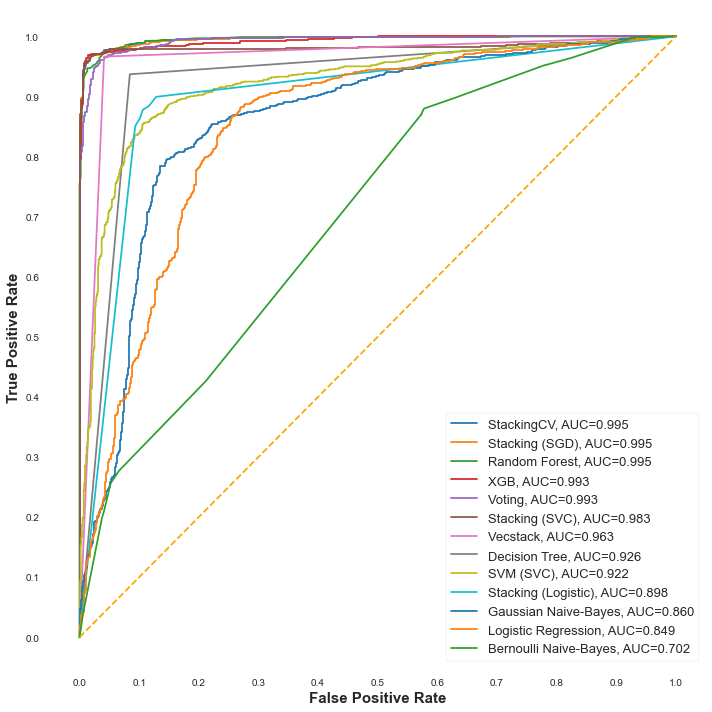

In [109]:
fig = plt.figure(figsize=(10,10))

for i in roc_plot_df.index:
    plt.plot(roc_plot_df.loc[i]['FPR'], 
             roc_plot_df.loc[i]['TPR'], 
             label="{}, AUC={:.3f}".format(i, roc_plot_df.loc[i]['AUC']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')
plt.rcParams.update({'figure.autolayout': True})

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False Positive Rate", fontsize=15, fontweight="bold")

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15, fontweight="bold")

#plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')
plt.savefig('ROC_Curve_Analysis.png')

plt.show()

In [117]:
results_df_temp.reset_index(inplace=True)
df_results_temp_scatter = results_df_temp[(results_df_temp['Recall']>0.95) & (results_df_temp['Precision']>0.95)]
df_results_temp_scatter = df_results_temp_scatter.loc[:, ['Classifier','Precision', 'Recall']].sort_values(by='Precision')

In [118]:
df_results_temp_scatter

,Classifier,Precision,Recall
10,Vecstack,0.958711,0.966497
11,Voting,0.964286,0.959391
4,Random Forest,0.969199,0.958376
9,StackingCV,0.979466,0.968528
7,Stacking (SGD),0.980453,0.967513
8,Stacking (SVC),0.986416,0.958376
12,XGB,0.988530,0.962437


In [119]:
precision = df_results_temp_scatter['Precision'].to_list
recall = df_results_temp_scatter['Recall'].to_list
classifier = df_results_temp_scatter['Classifier'].to_list

<Figure size 576x396 with 0 Axes>

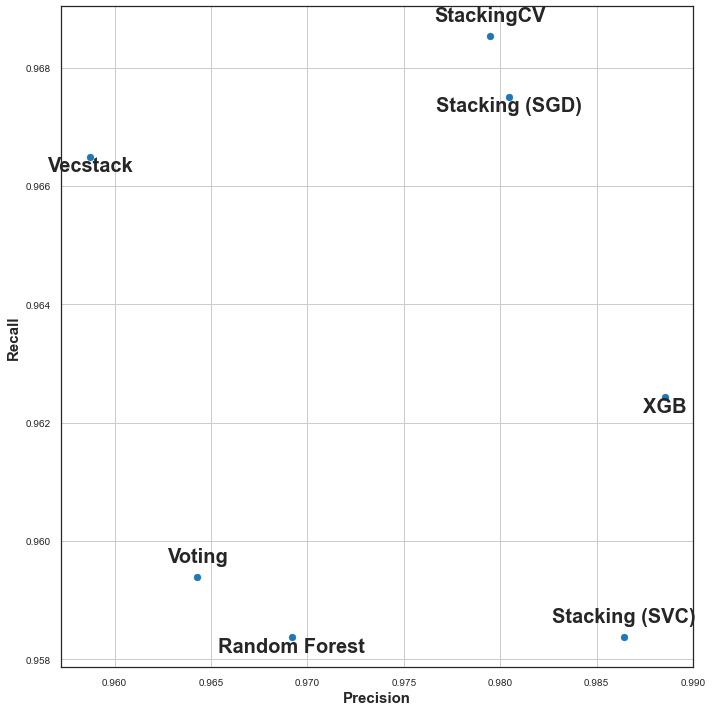

In [120]:
plt.clf()
plt.rcParams.update({'figure.autolayout': True})
plt.figure(figsize=(10,10))
plt.rcParams["axes.edgecolor"] = "0.15"
plt.rcParams["axes.linewidth"]  = 1.25
plt.scatter(df_results_temp_scatter.Precision, df_results_temp_scatter.Recall)
plt.grid()
temp = -1
temp_1 = -1
for x,y,z in zip(df_results_temp_scatter.Precision, df_results_temp_scatter.Recall, df_results_temp_scatter.Classifier):
    temp_1 = temp_1*temp

    plt.annotate(z, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 xytext=(0,-15*temp_1), # distance from text to points (x,y)
                 fontweight="bold", 
                 fontsize = 20, 
                 ha='center') # horizontal alignment can be left, right or center

#plt.title("Precision vs. Recall", fontsize = 15, fontweight="bold")
plt.xlabel("Precision", fontsize=15, fontweight="bold")
plt.ylabel("Recall", fontsize=15, fontweight="bold")
plt.savefig('Precision_vs_Recall.png')
plt.show()

In [114]:
results_df_final = results_df_temp.iloc[:, [0,1,3,2,4,5,8,9,10,11,12]].sort_values(by='AUC', ascending=False)

In [115]:
results_df_final

,Classifier,Features,Parameters,Accuracy,Recall,Precision,AUC,True_Positives,True_Negatives,False_Positives,False_Negatives
9,StackingCV,Reduced,Best,0.974255,0.968528,0.979466,0.995329,954,976,20,31
7,Stacking (SGD),Reduced,Best,0.974255,0.967513,0.980453,0.995065,953,977,19,32
4,Random Forest,Reduced,Default,0.964160,0.958376,0.969199,0.995022,944,966,30,41
12,XGB,Reduced,Default,0.975770,0.962437,0.988530,0.993093,948,985,11,37
11,Voting,Reduced,Best,0.962140,0.959391,0.964286,0.992768,945,961,35,40
8,Stacking (SVC),Reduced,Best,0.972741,0.958376,0.986416,0.982644,944,983,13,41
10,Vecstack,Reduced,Best,0.962645,0.966497,0.958711,0.962666,952,955,41,33
1,Decision Tree,Reduced,Default,0.926300,0.937056,0.916584,0.926359,923,912,84,62
5,SVM (SVC),Full,Default,0.864715,0.891371,0.845043,0.921697,878,835,161,107
6,Stacking (Logistic),Reduced,Best,0.884402,0.873096,0.892116,0.898264,860,892,104,125


In [116]:
results_df_final.to_excel("results_final.xlsx", sheet_name='Sheet_name_1')